In [1]:
import pandas as pd
import numpy as np
import re
import nltk
pd.set_option('display.max_columns', None)

#εισαγωγή βιβλιοθηκών

In [2]:
df = pd.read_csv("JobsDataset.csv")
df.head()

#άνοιγμα του αρχείου JobsDataset

,ID,Query,Job Title,Description
0,1,Data Scientist,Junior Data Scientist Apprenticeship,Job Description As a Junior Data Scientist at ...
1,2,Data Scientist,"HBO Data Scientist, Content Science",OVERALL SUMMARY As a Data Scientist on the Dat...
2,3,Data Scientist,Junior Data Scientist,The Team: The Data science team is a newly for...
3,4,Data Scientist,Jr Data Scientist,We now have a need for junior Data Scientist(s...
4,5,Data Scientist,"Data Scientist, Premium Content",Do you want to help guide the core business of...


In [3]:
len(df)

10000

In [4]:
df['Description'][0]

"Job Description As a Junior Data Scientist at IBM, you will work as part of a team to solve business-related problems using data-driven techniques. You will apply the scientific method to business scenarios, clean and prepare data for statistical and machine learning modeling, work with a variety of analytical algorithms to build models that better explain data relationships and predict potential scenarios, translate data insights into business value, and communicate results to difference audiences. You will also master different technologies for model deployment. Throughout your apprenticeship, you’ll work closely with other experienced data scientists and mentors in an interactive, collaborative environment. You’ll learn the fundamentals of probability, statistics, linear algebra, data preparation, data modeling, and deployment of machine learning models. In addition, you will be introduced to additional concepts, skills and tools including Python, Hadoop, and Spark, presentation sk

In [5]:
df['clean_Description'] = df['Description'].str.lower()
df['clean_Description'] = df['clean_Description'].apply(lambda x: re.sub('[^a-zA-Z]', ' ', x))
df['clean_Description'] = df['clean_Description'].apply(lambda x: re.sub('\s+', ' ', x))
df['clean_Description']

#Κάνουμε clean την στήλη Description.Αφαιρούμε τα κεφαλαία σύμβολα όπως και κάποια κενά και σημεία στίξης 

0       job description as a junior data scientist at ...
1       overall summary as a data scientist on the dat...
2       the team the data science team is a newly form...
3       we now have a need for junior data scientist s...
4       do you want to help guide the core business of...
                              ...                        
9995    the opportunity our customers understand that ...
9996    the nasa ames research center has the requirem...
9997    what you ll do distinguished engineer with pro...
9998    software development engineer full stack entry...
9999    architect san francisco ca leading provider of...
Name: clean_Description, Length: 10000, dtype: object

In [6]:
df['clean_Description'] = df['clean_Description'].apply(lambda x: nltk.word_tokenize(x))
df['clean_Description']

#Με το nltk.word_tokenize ξεχωρίζουμε την κάθε λέξη

0       [job, description, as, a, junior, data, scient...
1       [overall, summary, as, a, data, scientist, on,...
2       [the, team, the, data, science, team, is, a, n...
3       [we, now, have, a, need, for, junior, data, sc...
4       [do, you, want, to, help, guide, the, core, bu...
                              ...                        
9995    [the, opportunity, our, customers, understand,...
9996    [the, nasa, ames, research, center, has, the, ...
9997    [what, you, ll, do, distinguished, engineer, w...
9998    [software, development, engineer, full, stack,...
9999    [architect, san, francisco, ca, leading, provi...
Name: clean_Description, Length: 10000, dtype: object

In [7]:
stop_words = nltk.corpus.stopwords.words('english')
Description = []
for sentence in df['clean_Description']:
    temp = []
    for word in sentence:
        if word not in stop_words and len(word) >= 3:
            temp.append(word)
    Description.append(temp)
Description
#Ομαδοποίηση όλων των tokens της καινούργιας στήλης clean_description 

[['job',
  'description',
  'junior',
  'data',
  'scientist',
  'ibm',
  'work',
  'part',
  'team',
  'solve',
  'business',
  'related',
  'problems',
  'using',
  'data',
  'driven',
  'techniques',
  'apply',
  'scientific',
  'method',
  'business',
  'scenarios',
  'clean',
  'prepare',
  'data',
  'statistical',
  'machine',
  'learning',
  'modeling',
  'work',
  'variety',
  'analytical',
  'algorithms',
  'build',
  'models',
  'better',
  'explain',
  'data',
  'relationships',
  'predict',
  'potential',
  'scenarios',
  'translate',
  'data',
  'insights',
  'business',
  'value',
  'communicate',
  'results',
  'difference',
  'audiences',
  'also',
  'master',
  'different',
  'technologies',
  'model',
  'deployment',
  'throughout',
  'apprenticeship',
  'work',
  'closely',
  'experienced',
  'data',
  'scientists',
  'mentors',
  'interactive',
  'collaborative',
  'environment',
  'learn',
  'fundamentals',
  'probability',
  'statistics',
  'linear',
  'algebra',


In [8]:
df['clean_Description'] = Description

#Ορίζω σαν clean_Description = Description

In [9]:
df['clean_Description'] #Εμφάνιση

0       [job, description, junior, data, scientist, ib...
1       [overall, summary, data, scientist, data, scie...
2       [team, data, science, team, newly, formed, app...
3       [need, junior, data, scientist, area, remote, ...
4       [want, help, guide, core, business, spotify, u...
                              ...                        
9995    [opportunity, customers, understand, digital, ...
9996    [nasa, ames, research, center, requirement, se...
9997    [distinguished, engineer, proven, technology, ...
9998    [software, development, engineer, full, stack,...
9999    [architect, san, francisco, leading, provider,...
Name: clean_Description, Length: 10000, dtype: object

In [10]:
df.head()

,ID,Query,Job Title,Description,clean_Description
0,1,Data Scientist,Junior Data Scientist Apprenticeship,Job Description As a Junior Data Scientist at ...,"[job, description, junior, data, scientist, ib..."
1,2,Data Scientist,"HBO Data Scientist, Content Science",OVERALL SUMMARY As a Data Scientist on the Dat...,"[overall, summary, data, scientist, data, scie..."
2,3,Data Scientist,Junior Data Scientist,The Team: The Data science team is a newly for...,"[team, data, science, team, newly, formed, app..."
3,4,Data Scientist,Jr Data Scientist,We now have a need for junior Data Scientist(s...,"[need, junior, data, scientist, area, remote, ..."
4,5,Data Scientist,"Data Scientist, Premium Content",Do you want to help guide the core business of...,"[want, help, guide, core, business, spotify, u..."


In [11]:
df['Job Title'] = df['Job Title'].apply(lambda x: x.split(',')[:4])

#Στην στήλη Job Title ξεχωρίζω τις ΄λέξεις μεταξύ τους

In [12]:
df['Job Title'][0] #παράδειγμα εμφάνισης στοιχείου 0

['Junior Data Scientist Apprenticeship']

In [13]:
def clean(sentence):
    temp = []
    for word in sentence:
        temp.append(word.lower().replace(' ', ''))
    return temp

#Βγάζουμε τα κεφαλαία και τα κενά

In [14]:
df['Job Title'] = [clean(x) for x in df['Job Title']] 

#Χρησιμοποιούμε την συνάρτηση clean που φτιάξαμε προηγουμένος

In [15]:
df['Job Title'][0]

#παράδειγμα εμφάνισης στοιχείου 0

['juniordatascientistapprenticeship']

In [17]:
columns = ['clean_Description','Job Title']
l = []
for i in range(len(df)):
    words = ''
    for col in columns:
        words += ' '.join(df[col][i]) + ' '
    l.append(words)
l

#Σύπτυξη clean_Description με Job Title 

['job description junior data scientist ibm work part team solve business related problems using data driven techniques apply scientific method business scenarios clean prepare data statistical machine learning modeling work variety analytical algorithms build models better explain data relationships predict potential scenarios translate data insights business value communicate results difference audiences also master different technologies model deployment throughout apprenticeship work closely experienced data scientists mentors interactive collaborative environment learn fundamentals probability statistics linear algebra data preparation data modeling deployment machine learning models addition introduced additional concepts skills tools including python hadoop spark presentation skills communication skills apply skills prepare successfully obtain data science experience may lead certification junior data scientist ibm certification junior data scientist provides credentials career 

In [18]:
df['clean_input'] = l
df = df[['Query', 'clean_input']]
df.head()

#Δήλωση πίνακα l σε clean_input 

#Εμφάνιση Query και clean_input

,Query,clean_input
0,Data Scientist,job description junior data scientist ibm work...
1,Data Scientist,overall summary data scientist data science so...
2,Data Scientist,team data science team newly formed applied re...
3,Data Scientist,need junior data scientist area remote success...
4,Data Scientist,want help guide core business spotify using in...


In [19]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_Query = TfidfVectorizer()
X = tfidf_Query.fit_transform(df['clean_input'].values) #fitting and transforming the vector
print(X.shape)

#Με την βιβλιοθήκη TfidfVectorizer 

(10000, 43451)


In [21]:
from sklearn.cluster import KMeans

wcss = []
for i in range (1,15):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state=42, max_iter=600, n_init=1)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

C:\Users\dimit\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


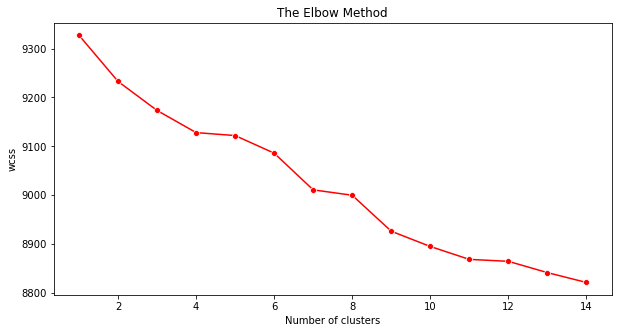

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,5))
sns.lineplot(range(1,15),wcss,marker='o', color = 'red')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.show()

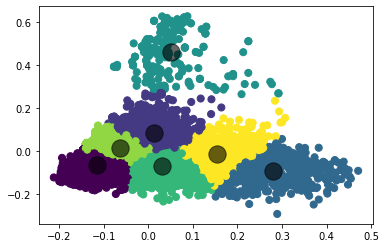

In [23]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

sklearn_pca = PCA(n_components =2)

Y_sklearn = sklearn_pca.fit_transform(X.toarray())
kmeans = KMeans(n_clusters = 7, init = 'k-means++', max_iter=600, n_init=1,random_state=42)
fitted = kmeans.fit(Y_sklearn)
prediction = kmeans.predict(Y_sklearn)

plt.scatter(Y_sklearn[:, 0], Y_sklearn[:, 1], c = prediction, s=50, cmap = 'viridis')

centers = kmeans.cluster_centers_

plt.scatter(centers[:, 0], centers[:, 1], c = 'black', s=300, alpha=0.6);

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
tfidf = TfidfVectorizer()
features = tfidf.fit_transform(df['clean_input'])

#Με την βιβλιοθήκη TfidfVectorizer και χρησιμοποιώντας CountVectorizer μετατρέπουμε τα στοιχεία σε δείκτες και υλοποιούμε την matrix μέτρηση   

In [26]:
from sklearn.metrics.pairwise import cosine_similarity
cosine_sim = cosine_similarity(features, features)
print(cosine_sim)

#Με την χρήση του cosine_similarity υπολογίζουμε μεταξύ των δεικτών του παραπάνω πίνακα 

[[1.         0.11226554 0.14537237 ... 0.05991906 0.06906908 0.04018261]
 [0.11226554 1.         0.11710424 ... 0.06132908 0.05581553 0.0777939 ]
 [0.14537237 0.11710424 1.         ... 0.08771546 0.04129038 0.0477865 ]
 ...
 [0.05991906 0.06132908 0.08771546 ... 1.         0.07048355 0.09173689]
 [0.06906908 0.05581553 0.04129038 ... 0.07048355 1.         0.06456273]
 [0.04018261 0.0777939  0.0477865  ... 0.09173689 0.06456273 1.        ]]


In [27]:
index = pd.Series(df['Query'])
index.head()

#εμφάνιση σε μορφ΄η στήλης των στοιχείων του Query

0    Data Scientist
1    Data Scientist
2    Data Scientist
3    Data Scientist
4    Data Scientist
Name: Query, dtype: object

In [28]:
def recommend_jobs(title):
    jobs = []
    idx = index[index == title].index[0]
    # print(idx)
    score = pd.Series(cosine_sim[idx]).sort_values(ascending=False)
    top10 = list(score.iloc[1:11].index)
    # print(top10)
    
    for i in top10:
        jobs.append(df['Query'][i])
    return jobs

#Φτιάχνουμε την συνάρτηση recommend_jobs η οποία δέχεται τις μετρήσεις του cosine_similarity και τυπώνει τις 10 πιο σχετικές αναζητήσεις 

In [29]:
recommend_jobs('Data Analyst') #Εδώ βάζουμε την κατηγορία που ανήκει η θέση εργασίας (Query) και μας β΄γαζει σαν αποτέλεσμα τις 10 πιο σχετικές αναζητήσεις 

['Data Scientist',
 'Machine Learning',
 'Big Data Engineer',
 'IT Systems Administrator',
 'Data Engineer',
 'Information Security Analyst',
 'Technical Operations',
 'Data Architect',
 'Data Architect',
 'Data Warehousing']

In [30]:
pd.Series(cosine_sim[3]).sort_values(ascending=False)

#Τυπώνουμε τα αποτελέσματα του cosine_similarity σε σειρά απο το πιο σχετικό έως πιο αδιάφορο 

3       1.000000
3409    0.251420
3297    0.250015
3651    0.247084
267     0.244543
          ...   
9136    0.000000
2719    0.000000
2840    0.000000
1921    0.000000
2423    0.000000
Length: 10000, dtype: float64